# PREDICTING FUTURE PRODUCT PRICES USING FACEBOOK PROPHET 



# TASK #1: PROJECT OVERVIEW 


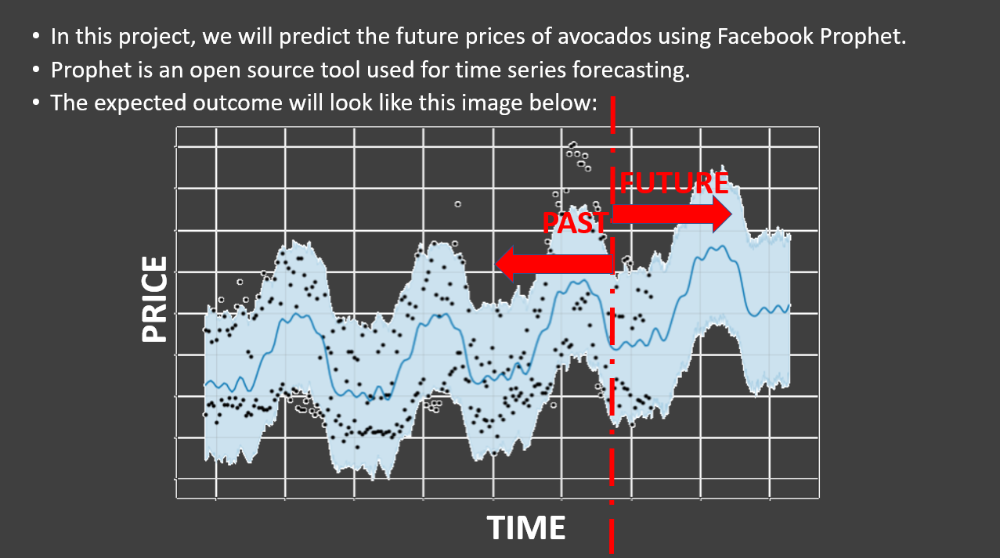


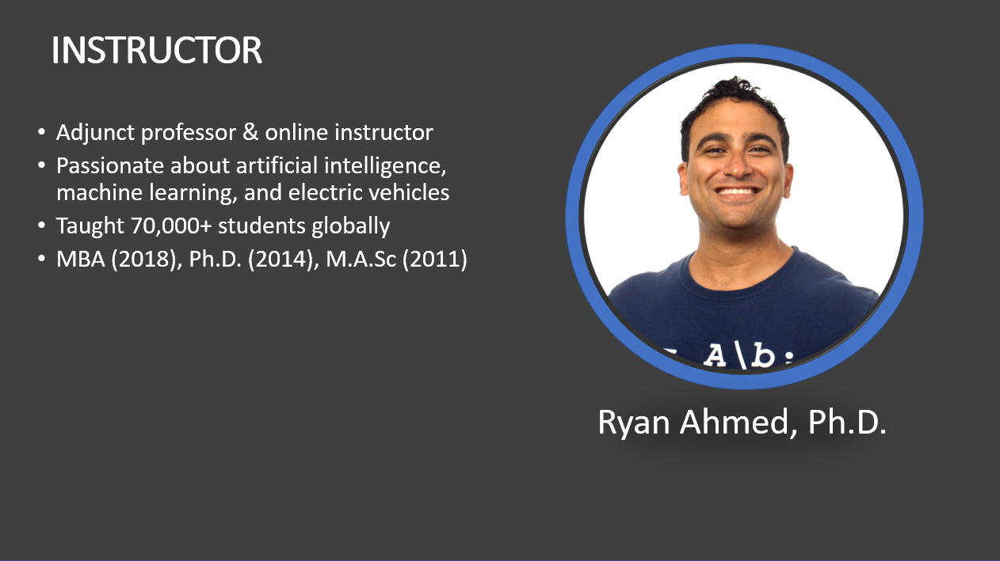

# TASK #2: IMPORT LIBRARIES AND DATASET

- You must install fbprophet package as follows: 
     pip install fbprophet
     
- If you encounter an error, try: 
    conda install -c conda-forge fbprophet



In [ ]:
# 看一下我们已经安装了哪些库
pip list

In [ ]:
# 安装Pystan
pip install pystan

In [ ]:
# 安装fbprophet
conda install -c conda-forge fbprophet

In [1]:
# import libraries 
import pandas as pd # Import Pandas for data manipulation using dataframes
import numpy as np # Import Numpy for data statistical analysis 
import matplotlib.pyplot as plt # Import matplotlib for data visualisation
import random
import seaborn as sns
from fbprophet import Prophet


Importing plotly failed. Interactive plots will not work.


In [2]:
# dataframes creation for both training and testing datasets 
avocado_df = pd.read_csv('avocado.csv')


- Date: The date of the observation
- AveragePrice: the average price of a single avocado
- type: conventional or organic
- year: the year
- Region: the city or region of the observation
- Total Volume: Total number of avocados sold
- 4046: Total number of avocados with PLU 4046 sold
- 4225: Total number of avocados with PLU 4225 sold
- 4770: Total number of avocados with PLU 4770 sold

In [ ]:
# Let's view the head of the training dataset（显示变量名和前5行数据）
avocado_df.head(5)

In [ ]:
# Let's view the last elements in the training dataset（显示变量名和前10行数据）
avocado_df.tail(10)

In [ ]:
# 描述性统计
avocado_df.describe()

In [ ]:
# 显示各变量的类型
avocado_df.info()

In [ ]:
# 检查并返回各变量中null的个数
avocado_df.isnull().sum()

# TASK #3: EXPLORE DATASET  

In [3]:
# 将数据按Date重新排序
avocado_df = avocado_df.sort_values('Date')
avocado_df.head(10)

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
11569,51,2015-01-04,1.75,27365.89,9307.34,3844.81,615.28,13598.46,13061.10,537.36,0.00,organic,2015,Southeast
9593,51,2015-01-04,1.49,17723.17,1189.35,15628.27,0.00,905.55,905.55,0.00,0.00,organic,2015,Chicago
10009,51,2015-01-04,1.68,2896.72,161.68,206.96,0.00,2528.08,2528.08,0.00,0.00,organic,2015,HarrisburgScranton
1819,51,2015-01-04,1.52,54956.80,3013.04,35456.88,1561.70,14925.18,11264.80,3660.38,0.00,conventional,2015,Pittsburgh
9333,51,2015-01-04,1.64,1505.12,1.27,1129.50,0.00,374.35,186.67,187.68,0.00,organic,2015,Boise
2807,51,2015-01-04,0.75,758118.95,426878.87,147958.43,15267.89,168013.76,165202.22,2811.54,0.00,conventional,2015,WestTexNewMexico
1195,51,2015-01-04,0.85,2682159.95,1837999.65,524430.47,64225.78,255504.05,215571.80,36981.72,2950.53,conventional,2015,LosAngeles
10269,51,2015-01-04,1.50,6329.83,3730.80,2141.91,0.00,457.12,426.67,30.45,0.00,organic,2015,LasVegas
103,51,2015-01-04,1.00,435021.49,364302.39,23821.16,82.15,46815.79,16707.15,30108.64,0.00,conventional,2015,Atlanta
1143,51,2015-01-04,0.80,317861.35,134003.07,120628.37,4591.23,58638.68,58126.59,512.09,0.00,conventional,2015,LasVegas


In [ ]:
# Plot date and average price
plt.figure( figsize=(20,10) )  # 设定图像的长宽尺寸
plt.plot( avocado_df['Date'], avocado_df['AveragePrice'] )


In [ ]:
# 使用seaborn输出某变量(平均价格)的分布情况，用蓝色显示

plt.figure( figsize=(5,3) )  # 也不一定非要设置图像的尺寸

sns.distplot(avocado_df['AveragePrice'],color='b') 

In [ ]:
# Plot a violin plot of the average price vs. avocado type

sns.violinplot(y = 'AveragePrice', x = 'type', data= avocado_df)

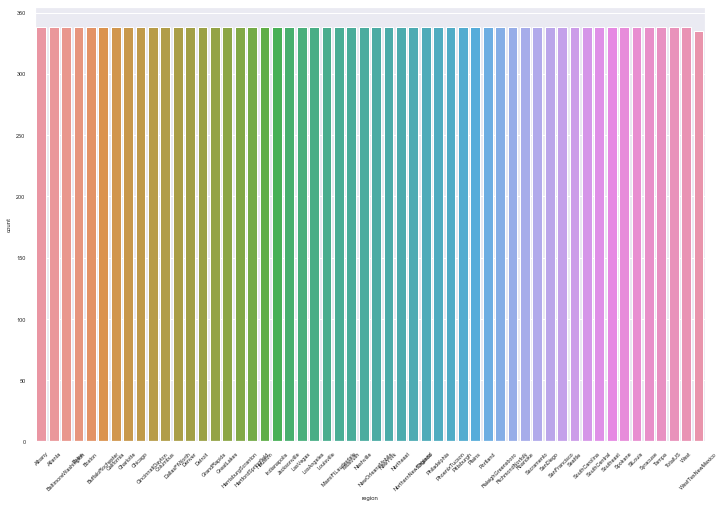

In [35]:
# Bar Chart to indicate the number of regions 

sns.set(font_scale=0.5)  # 坐标轴上文字的字号
plt.figure(figsize=[12,8])
plt.xticks(rotation = 45)

sns.countplot(x = 'region', data = avocado_df) # 查看数据点随region的分布情况


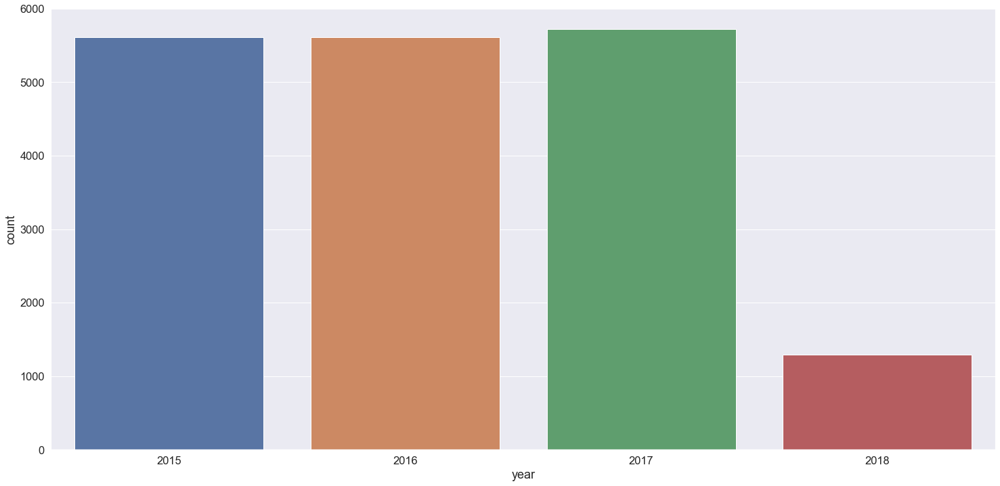

In [36]:
# Bar Chart to indicate the count in every year
sns.set(font_scale=1.5)
plt.figure(figsize=(25,12))
sns.countplot(x = 'year', data = avocado_df) # 查看数据点随year的分布情况



<Figure size 1440x1440 with 0 Axes>

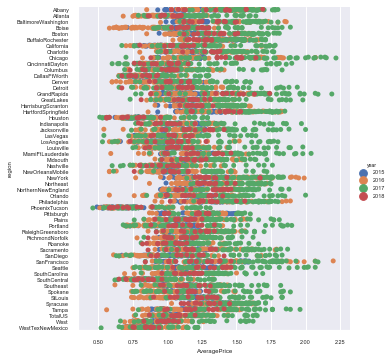

In [38]:
 # plot the avocado prices vs. regions for conventional avocados
plt.figure(figsize=(20,20))
sns.set(font_scale=0.5) 
sns.catplot(x = 'AveragePrice', y = 'region', hue = 'year', data = avocado_df[avocado_df['type'] == 'conventional'])
height=20


<Figure size 1440x1440 with 0 Axes>

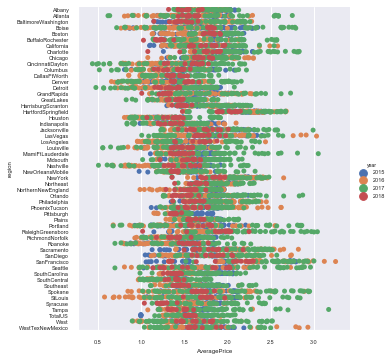

In [34]:
  # plot the avocado prices vs. regions for organic avocados
plt.figure(figsize=(20,20))
sns.set(font_scale=0.5) 
sns.catplot(x = 'AveragePrice', y = 'region', hue = 'year', data = avocado_df[avocado_df['type'] == 'organic']) 

# TASK 4: PREPARE THE DATA BEFORE APPLYING FACEBOOK PROPHET TOOL 

In [4]:
# 仅提取Date和AveragePrice两个变量，准备用于prophet
avocado_prophet_df = avocado_df[['Date','AveragePrice']]

In [5]:
avocado_prophet_df

,Date,AveragePrice
11569,2015-01-04,1.75
9593,2015-01-04,1.49
10009,2015-01-04,1.68
1819,2015-01-04,1.52
9333,2015-01-04,1.64
...,...,...
8574,2018-03-25,1.36
9018,2018-03-25,0.70
18141,2018-03-25,1.42
17673,2018-03-25,1.70


In [6]:
# 将两个变量重命名
avocado_prophet_df = avocado_prophet_df.rename(columns = {'Date':'ds', 'AveragePrice':'y'})

In [7]:
avocado_prophet_df

,ds,y
11569,2015-01-04,1.75
9593,2015-01-04,1.49
10009,2015-01-04,1.68
1819,2015-01-04,1.52
9333,2015-01-04,1.64
...,...,...
8574,2018-03-25,1.36
9018,2018-03-25,0.70
18141,2018-03-25,1.42
17673,2018-03-25,1.70


# TASK 5: UNDERSTAND INTUITION BEHIND FACEBOOK PROPHET

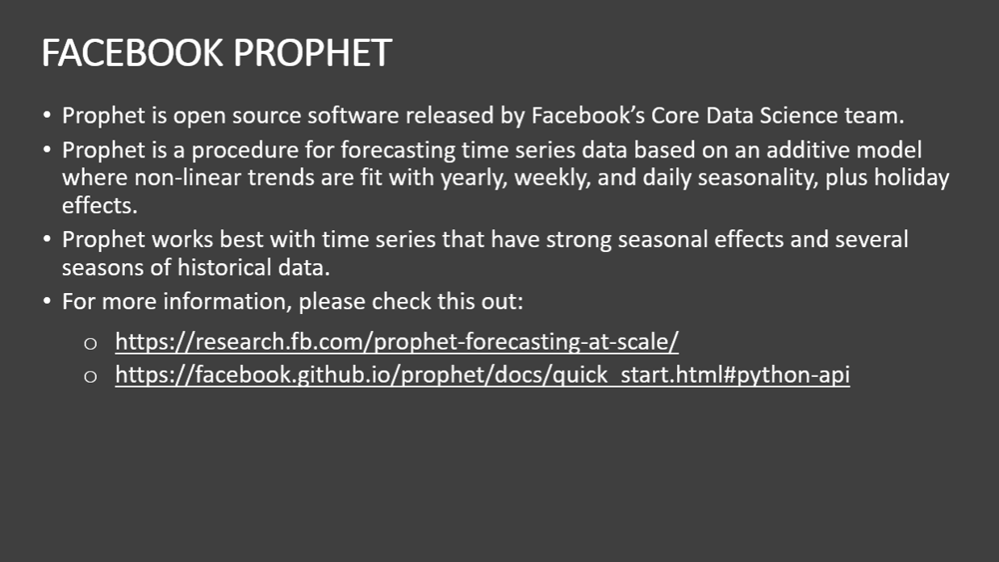

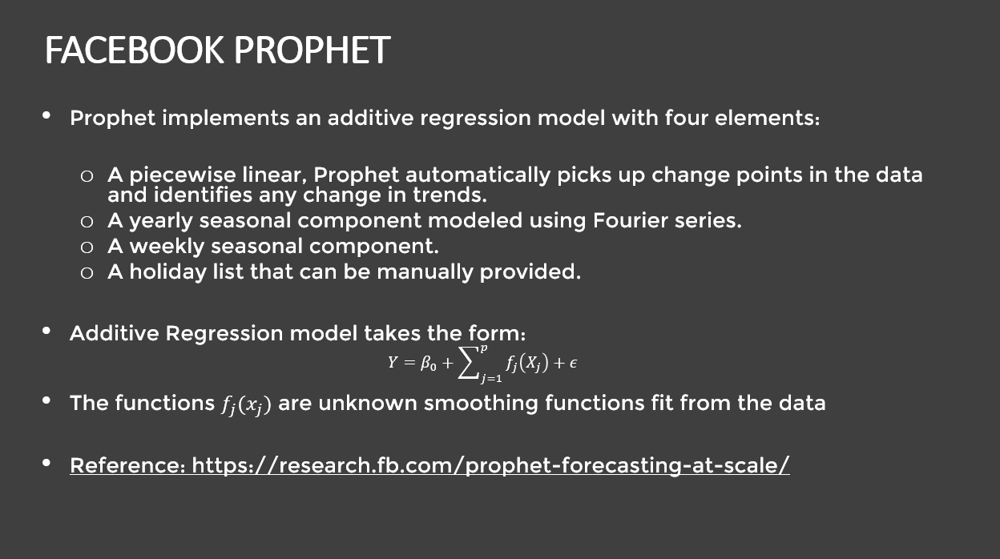

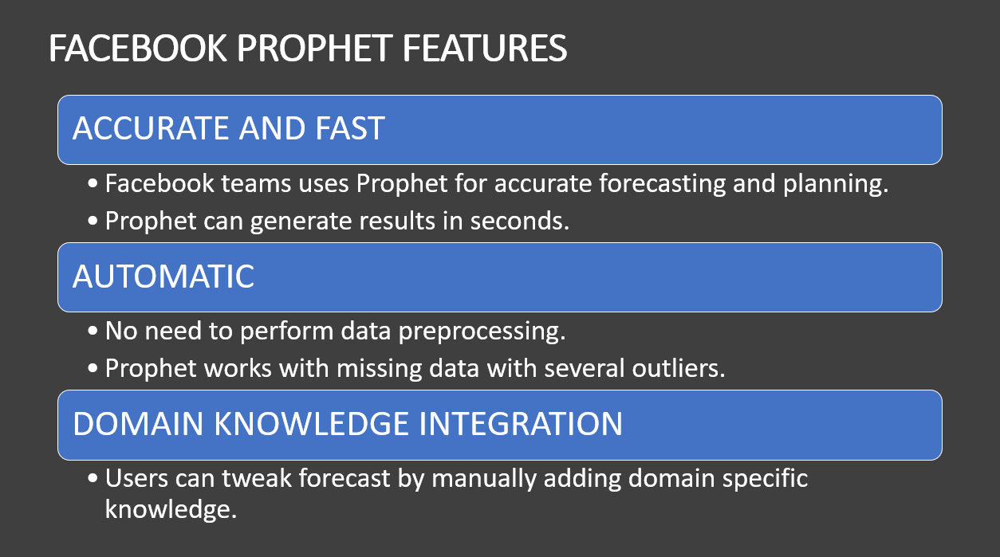

# TASK 6: DEVELOP MODEL AND MAKE PREDICTIONS - PART A

In [8]:
# 建立模型，使用拟合方法
m = Prophet()
m.fit(avocado_prophet_df)

INFO:numexpr.utils:NumExpr defaulting to 8 threads.
INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [9]:
# Forcasting into the future
future = m.make_future_dataframe(periods = 365)
forecast = m.predict(future)

In [10]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2015-01-04,1.497917,0.923384,1.882644,1.497917,1.497917,-0.113109,-0.113109,-0.113109,-0.113109,-0.113109,-0.113109,0.0,0.0,0.0,1.384809
1,2015-01-04,1.497917,0.878512,1.876827,1.497917,1.497917,-0.113109,-0.113109,-0.113109,-0.113109,-0.113109,-0.113109,0.0,0.0,0.0,1.384809
2,2015-01-04,1.497917,0.913582,1.830934,1.497917,1.497917,-0.113109,-0.113109,-0.113109,-0.113109,-0.113109,-0.113109,0.0,0.0,0.0,1.384809
3,2015-01-04,1.497917,0.936354,1.873254,1.497917,1.497917,-0.113109,-0.113109,-0.113109,-0.113109,-0.113109,-0.113109,0.0,0.0,0.0,1.384809
4,2015-01-04,1.497917,0.892000,1.870175,1.497917,1.497917,-0.113109,-0.113109,-0.113109,-0.113109,-0.113109,-0.113109,0.0,0.0,0.0,1.384809
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18609,2019-03-21,1.161737,0.531767,1.586705,0.982100,1.346121,-0.086289,-0.086289,-0.086289,-0.086289,-0.086289,-0.086289,0.0,0.0,0.0,1.075448
18610,2019-03-22,1.161007,0.521714,1.607439,0.980087,1.345927,-0.084622,-0.084622,-0.084622,-0.084622,-0.084622,-0.084622,0.0,0.0,0.0,1.076384
18611,2019-03-23,1.160276,0.566318,1.622586,0.978074,1.345704,-0.082682,-0.082682,-0.082682,-0.082682,-0.082682,-0.082682,0.0,0.0,0.0,1.077594
18612,2019-03-24,1.159545,0.553588,1.633670,0.976001,1.345826,-0.080489,-0.080489,-0.080489,-0.080489,-0.080489,-0.080489,0.0,0.0,0.0,1.079056


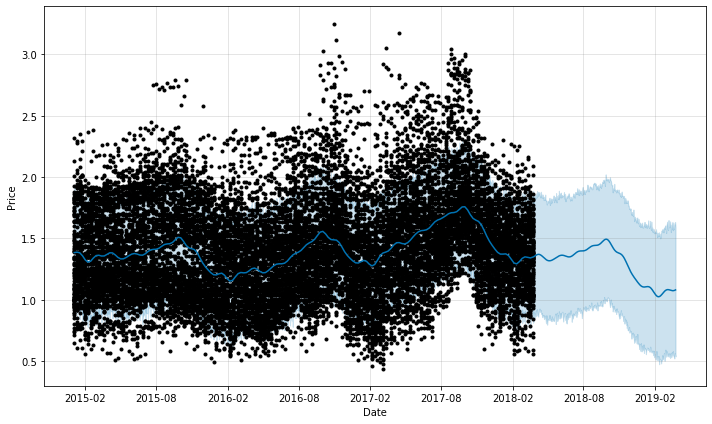

In [11]:
# 将预测结果可视化
figure = m.plot(forecast, xlabel = 'Date',ylabel = 'Price')

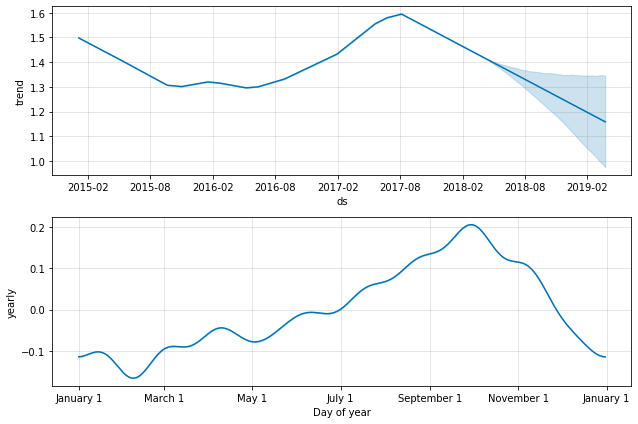

In [12]:
#显示预测结果中包含的各部分趋势
figure2 = m.plot_components(forecast)

# TASK 7: DEVELOP MODEL AND MAKE PREDICTIONS (REGION SPECIFIC) - PART B

In [13]:
# dataframes creation for both training and testing datasets 
avocado_df = pd.read_csv('avocado.csv')


In [24]:
# Select specific region
avocado_df_sample = avocado_df[avocado_df['region']=='Chicago']

In [25]:
# 安装Date排序
avocado_df_sample = avocado_df_sample.sort_values('Date')

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


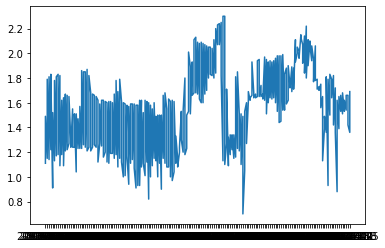

In [26]:
# 查看该地区平均价格如何随日期变动

plt.plot(avocado_df_sample['Date'], avocado_df_sample['AveragePrice'])

In [27]:
# 将Date和AveragePrice重命名
avocado_df_sample = avocado_df_sample.rename(columns={'Date':'ds','AveragePrice':'y'})


In [28]:
#建立模型
m = Prophet()
m.fit(avocado_df_sample)
# Forcasting into the future
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


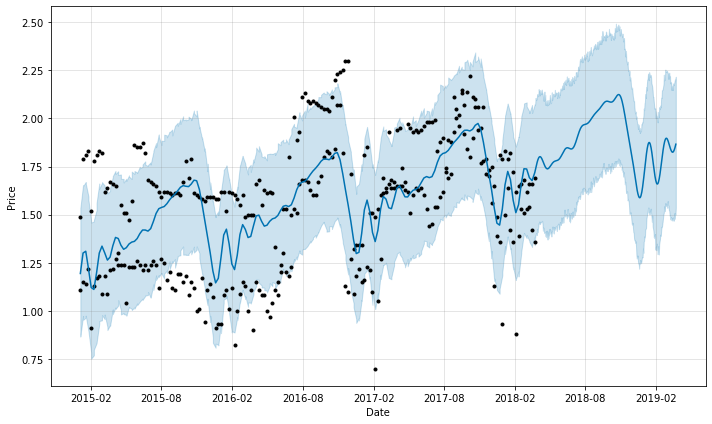

In [29]:
figure = m.plot(forecast, xlabel='Date', ylabel='Price')

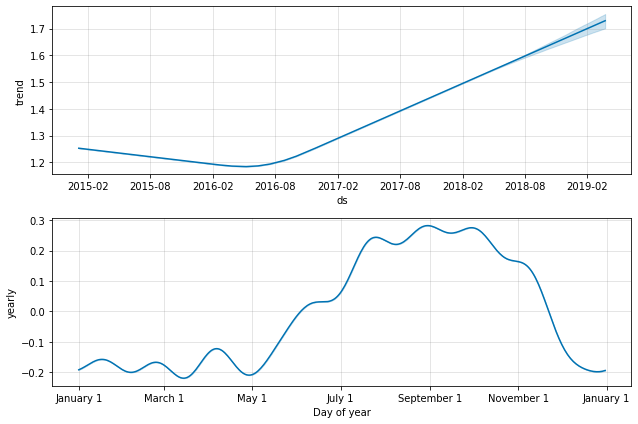

In [23]:
figure3 = m.plot_components(forecast)

# GREAT JOB!